In [1]:
# Pipeline Process Images and VGG19 training 
#1. resize
#2. Canny
#3. prepare data

#4. vgg19

In [1]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import VGG19
import pandas as pd
import tensorflow as tf

#from VGG19_helper import *

from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split




/Library/Python/3.9/site-packages/urllib3/__init__.py:34: NotOpenSSLWarning: urllib3 v2 only supports OpenSSL 1.1.1+, currently the 'ssl' module is compiled with 'LibreSSL 2.8.3'. See: https://github.com/urllib3/urllib3/issues/3020
  warnings.warn(


In [2]:
def apply_canny(image, t_lower=150, t_upper=160, aperture_size=3, l2_gradient=True):
    """Apply Canny edge detection to the input image."""
    #aperture_size=3, t_lower=150, t_upper=300) for pick-up movement
    #t_lower=100, t_upper=200, aperture_size=5 for poke_pen
    #150, 160, apertureSize=3 frame diff
    edge = cv2.Canny(image, t_lower, t_upper, 
                     apertureSize=aperture_size,  
                     L2gradient=l2_gradient)  
    return edge


def preprocess_image(img, size=(224, 224)):
    """Load, resize, and apply Canny edge detection to an image."""
    img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)  # Load image in grayscale
    img_resized = cv2.resize(img, size, interpolation=cv2.INTER_AREA)  # Resize image
    img_canny = apply_canny(img_resized)  # Apply canny edge detection
    img_canny_rgb = cv2.cvtColor(img_canny, cv2.COLOR_GRAY2RGB)  # Convert to 3-channel image
    return img_canny_rgb


def load_and_preprocess_images_from_csv(input_folder, csv_path, size=(224, 224)):
    df = pd.read_csv(csv_path, sep = ";")  # Adjust separator if necessary
    images = []
    labels = []

    for index, row in df.iterrows():
        image_name = str(row['Target']) + ".jpg"  
        label = row['Score']  
        image_path = os.path.join(input_folder, image_name)

        if os.path.exists(image_path):
            processed_image = preprocess_image(image_path, size)
            images.append(processed_image)
            labels.append(label)
        else:
            print(f"Image not found: {image_name}")

    return np.array(images), np.array(labels)



In [38]:

def create_vgg19_model(input_shape=(224, 224, 3), n_classes=3):
    """Create a VGG19-based model for multiclass classification."""
    # Load the VGG19 model without the top classification layers
    base_model = tf.keras.applications.VGG19(weights='imagenet', include_top=False, input_shape=input_shape)
    
    x = base_model.output
    x = Flatten()(x)
    x = Dense(512, activation='relu')(x)
    
    # Output layer for multiclass classification
    predictions = Dense(n_classes, activation='softmax')(x)
    
    # Compile the model with categorical crossentropy loss for multiclass classification
    model = Model(inputs=base_model.input, outputs=predictions)
    
    for layer in base_model.layers:
        layer.trainable = False

    
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                  loss='categorical_crossentropy', 
                  metrics=['accuracy', tf.keras.metrics.AUC()])
    
    return model



####


In [5]:
model = create_vgg19_model()
for i, layer in enumerate(model.layers):
    print(f"Layer {i}: {layer.name} - Trainable: {layer.trainable}")

Layer 0: input_1 - Trainable: False
Layer 1: block1_conv1 - Trainable: False
Layer 2: block1_conv2 - Trainable: False
Layer 3: block1_pool - Trainable: False
Layer 4: block2_conv1 - Trainable: False
Layer 5: block2_conv2 - Trainable: False
Layer 6: block2_pool - Trainable: False
Layer 7: block3_conv1 - Trainable: False
Layer 8: block3_conv2 - Trainable: False
Layer 9: block3_conv3 - Trainable: False
Layer 10: block3_conv4 - Trainable: False
Layer 11: block3_pool - Trainable: False
Layer 12: block4_conv1 - Trainable: False
Layer 13: block4_conv2 - Trainable: False
Layer 14: block4_conv3 - Trainable: False
Layer 15: block4_conv4 - Trainable: False
Layer 16: block4_pool - Trainable: False
Layer 17: block5_conv1 - Trainable: False
Layer 18: block5_conv2 - Trainable: False
Layer 19: block5_conv3 - Trainable: False
Layer 20: block5_conv4 - Trainable: False
Layer 21: block5_pool - Trainable: False
Layer 22: flatten - Trainable: True
Layer 23: dense - Trainable: True
Layer 24: dense_1 - Traina

In [51]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import numpy as np

def create_data_pipeline(X, y, batch_size):
    """
    Create a data pipeline that handles data augmentation and repeats the dataset indefinitely.

    Parameters:
    - X: Numpy array of images.
    - y: Numpy array of labels.
    - batch_size: Number of samples per batch.

    Returns:
    - dataset: TensorFlow dataset object.
    """
    # Create a TensorFlow dataset from the numpy arrays
    dataset = tf.data.Dataset.from_tensor_slices((X, y))
    
    # Shuffle, batch, and repeat the dataset
    dataset = dataset.shuffle(buffer_size=len(X))
    dataset = dataset.batch(batch_size)
    dataset = dataset.repeat()  # Repeat the dataset indefinitely
    
    return dataset

def train_model(model, X_train, y_train, X_val, y_val, batch_size=32, epochs=30):
    """Train the model with in-memory data augmentation."""
    
    # Define ImageDataGenerator for data augmentation
    datagen = ImageDataGenerator(
        rotation_range=40,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest'
    )
    
    # Convert one-hot encoded labels to class indices if needed
    if len(y_train.shape) > 1 and y_train.shape[1] > 1:
        y_train_labels = np.argmax(y_train, axis=1)
    else:
        y_train_labels = y_train
    
    # Determine the number of classes
    num_classes = np.max(y_train_labels) + 1 if y_train_labels.ndim == 1 else y_train.shape[1]
    
    # Create data pipeline with augmentation
    train_data_generator = datagen.flow(X_train, y_train, batch_size=batch_size)
    val_data_pipeline = create_data_pipeline(X_val, y_val, batch_size=batch_size)
    
    steps_per_epoch = int(np.ceil(len(X_train) / batch_size))
    
    # Define callbacks
    checkpointer = ModelCheckpoint(
        filepath="best_model.hdf5", 
        monitor="val_loss", 
        verbose=1, 
        save_best_only=True, 
        mode='auto'
    )
    early_stop = EarlyStopping(
        monitor='val_loss', 
        patience=10, 
        verbose=1, 
        restore_best_weights=True
    )
    
    # Train the model
    history = model.fit(
        train_data_generator,
        validation_data=val_data_pipeline,
        steps_per_epoch=steps_per_epoch,
        validation_steps=int(np.ceil(len(X_val) / batch_size)),
        epochs=epochs,
        callbacks=[checkpointer, early_stop],
        verbose=1
    )
    
    return model, history


In [ ]:
# Paths
input_folder = '/Users/nunofernandes/PycharmProjects/challenge_vc/differenced_frames_train'
csv_file = '/Users/nunofernandes/PycharmProjects/challenge_vc/poka_yoka_dif.csv'

# Load and preprocess images
X, y = load_and_preprocess_images_from_csv(input_folder, csv_file)

# Convert to one-hot encoding
num_classes = 3
one_hot_labels = tf.keras.utils.to_categorical(y, num_classes=num_classes)

# Split data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, one_hot_labels, test_size=0.2, random_state=42)

# Create VGG19 model
model = create_vgg19_model(input_shape=X_train.shape[1:], n_classes=num_classes)

# Train the model
model, history = train_model(model, X_train, y_train, X_val, y_val)

In [75]:
loss, auc = model.evaluate(X_val, y_val)

2/2 [==============================] - 9s 4s/step - loss: 0.2588 - accuracy: 0.8772 - auc_8: 0.9789


ValueError: too many values to unpack (expected 2)

In [74]:
print(f"Validation Loss: {loss:.4f}, Validation AUC: {auc:.4f}")

Validation Loss: 0.0109, Validation AUC: 1.0000


In [53]:
def make_predictions(model, input_folder, size=(224, 224)):
    """Make predictions on all images in a specified folder."""
    image_paths = [os.path.join(input_folder, filename) 
                   for filename in os.listdir(input_folder)
                   if filename.lower().endswith(('.jpg', '.jpeg', '.png'))]
    
    predictions = []
    for image_path in image_paths:
        processed_image = preprocess_image(image_path, size)
        processed_image = np.expand_dims(processed_image, axis=0)  # Add batch dimension
        prediction = model.predict(processed_image)[0]  # Get the single prediction for binary classification
        predictions.append(prediction)  # Binary class probability
        
    return predictions, image_paths

#from keras.models import load_model
#model_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/pick_up_without canny.hdf5'
#model = load_model(model_path)
predictions2,image_paths = make_predictions(model, input_folder = '/Users/nunofernandes/PycharmProjects/challenge_vc/differenced_frames_train')

1/1 [==============================] - 0s 171ms/step


In [102]:
#model3 = load_model('/Users/nunofernandes/PycharmProjects/challenge_vc/THIS_model.hdf5')

In [ ]:
def visualize_predictions(predictions, image_paths, threshold=0.5):
    """Visualize predictions for new images."""
    
    # Ensure predictions and image_paths are the same length
    if len(predictions) != len(image_paths):
        raise ValueError("Predictions and image paths must be of the same length.")
    
    # Sort the predictions and image paths by image names
    sorted_indices = sorted(range(len(image_paths)), key=lambda k: image_paths[k])
    sorted_image_paths = [image_paths[idx] for idx in sorted_indices]
    sorted_predictions = [predictions[idx] for idx in sorted_indices]

    num_images = len(sorted_image_paths)
    plt.figure(figsize=(15, num_images * 5))
    
    for i in range(num_images):
        image_path = sorted_image_paths[i]
        prediction = sorted_predictions[i]
        
        # Read and process the image
        img = cv2.imread(image_path)  # Read original image
        if img is None:
            print(f"Error loading image: {image_path}")
            continue

        img = cv2.resize(img, (224, 224))  # Resize to match the input size
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        
        # Show image
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(img)
        plt.title(f'Image {i+1}')
        plt.axis('off')
        
        # Show prediction
        prob_class_1 = float(prediction)  # Convert numpy.float32 to regular float
        plt.subplot(num_images, 2, 2*i + 2)
        plt.bar(['Class 0', 'Class 1'], [1 - prob_class_1, prob_class_1], color=['blue', 'red'])
        plt.title(f'Prediction: {"Class 1" if prob_class_1 > threshold else "Class 0"}')
        plt.ylim(0, 1)
        
    plt.tight_layout()
    plt.show()

# Example usage
input_folder = '/Users/nunofernandes/PycharmProjects/challenge_vc/vgg19_predict_pickup'
# Assuming you have `predictions` and `image_paths` from previous steps
predictions, image_paths = make_predictions(model=model, input_folder=input_folder)
visualize_predictions(predictions, image_paths)



In [57]:
def visualize_predictions_multi_class(predictions, image_paths, class_names, threshold=0.3):
    """Visualize predictions for new images with a threshold to highlight significant probabilities."""
    # Sort image paths and predictions by filename
    sorted_indices = sorted(range(len(image_paths)), key=lambda k: image_paths[k])
    sorted_image_paths = [image_paths[idx] for idx in sorted_indices]
    sorted_predictions = [predictions[idx] for idx in sorted_indices]
    
    num_images = len(sorted_image_paths)
    plt.figure(figsize=(15, num_images * 5))
    
    for i in range(num_images):
        image_path = sorted_image_paths[i]
        prediction = sorted_predictions[i]
        
        # Read and process the image
        img = cv2.imread(image_path)  # Read original image
        img = cv2.resize(img, (224, 224))  # Resize to match the input size
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
        
        # Display the image
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(img)
        plt.title(f'Image {i+1}\nFilename: {image_path.split("/")[-1]}')
        plt.axis('off')
        
        # Display the predictions
        plt.subplot(num_images, 2, 2*i + 2)
        bars = plt.bar(class_names, prediction, color=['blue', 'green', 'red'])
        
        # Highlight bars based on the threshold
        for j, bar in enumerate(bars):
            if prediction[j] > threshold:
                bar.set_color('orange')  # Highlight color for classes above the threshold
            else:
                bar.set_color('gray')  # Color for classes below the threshold
        
        # Determine and display the predicted class
        predicted_class = np.argmax(prediction)
        plt.title(f'Prediction: {class_names[predicted_class]} (Prob: {prediction[predicted_class]:.2f})')
        plt.ylim(0, 1)
        
    plt.tight_layout()
    plt.show()
    
input_folder = '/Users/nunofernandes/PycharmProjects/challenge_vc/differenced_frames_train'
# Make predictions on new images
predictions = make_predictions(model, input_folder)
# visualize_predictions_multi_class(predictions, image_paths, class_names)




1/1 [==============================] - 0s 168ms/step


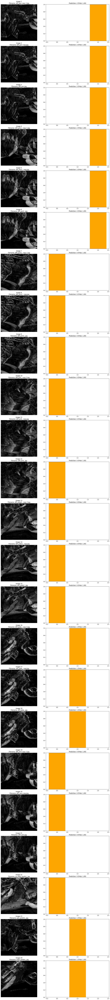

In [58]:
# Explored with Frame Differencing
visualize_predictions_multi_class(predictions[0], image_paths=predictions[1], class_names = [0,1,2], threshold=0.05)

In [59]:
model.save('VGG19_diff.hdf5')

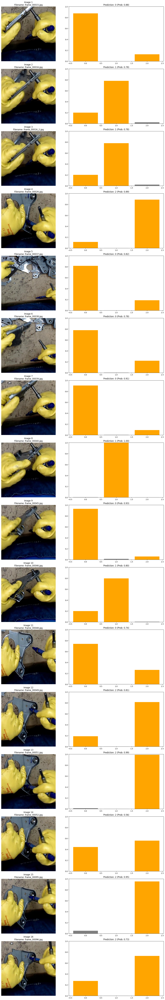

In [97]:
visualize_predictions_multi_class(predictions[0], image_paths=predictions[1], class_names = [0,1,2], threshold=0.05)

In [75]:
image_paths='/Users/nunofernandes/PycharmProjects/challenge_vc/vgg19_predict'

In [95]:
model.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0   

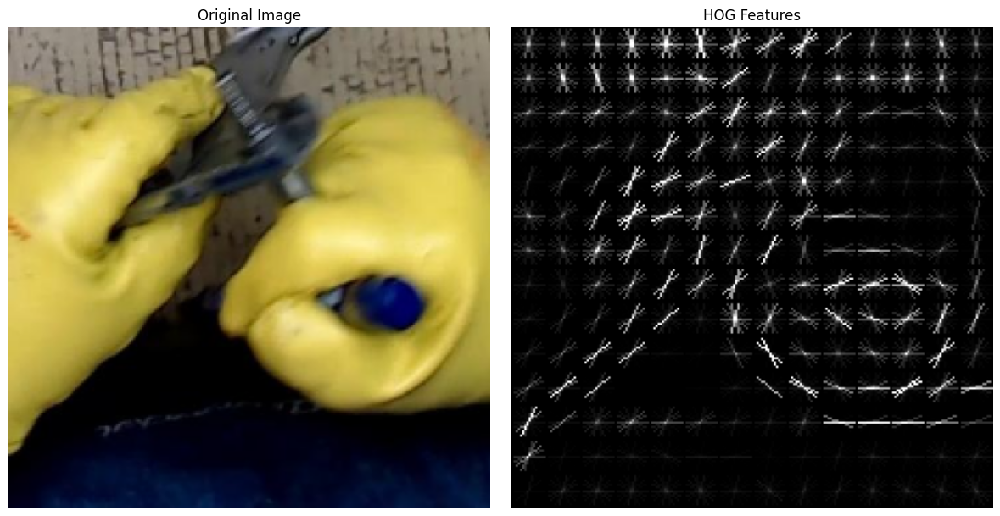

In [2]:
def extract_and_visualize_hog(image_path, resize_dim=(224, 224)):
    """Extract and visualize HOG features of an image."""
    # Load and preprocess the image
    img = cv2.imread(image_path)
    img = cv2.resize(img, resize_dim)  # Resize to match the input size
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    
    # Extract HOG features and visualize them
    hog_features, hog_image = hog(
        img_gray, 
        pixels_per_cell=(16, 16), 
        cells_per_block=(1, 1), 
        visualize=True
    )
    
    # Enhance the contrast of the HOG image for better visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    # Plot the original image and the HOG image
    plt.figure(figsize=(12, 6))
    
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))  # Convert to RGB for displaying
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title('HOG Features')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example usage
image_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/frames_5_xyz_w_cropped/frame_00041.jpg'
extract_and_visualize_hog(image_path)


In [55]:
import matplotlib.pyplot as plt
import cv2

import matplotlib.pyplot as plt
import cv2
import os

def visualize_predictions(predictions, image_paths, threshold=0.5):
    """Visualize predictions for new images ordered by their filenames."""
    # Sort image paths and predictions by the filename
    sorted_indices = sorted(range(len(image_paths)), key=lambda i: os.path.basename(image_paths[i]))
    sorted_image_paths = [image_paths[i] for i in sorted_indices]
    sorted_predictions = [predictions[i] for i in sorted_indices]
    
    num_images = len(sorted_predictions)
    plt.figure(figsize=(12, num_images * 4))  # Adjust the figure size based on number of images
    
    for i in range(num_images):
        img = cv2.imread(sorted_image_paths[i], cv2.IMREAD_GRAYSCALE)  # Read original image for display
        img = cv2.resize(img, (224, 224))  # Resize to match the input size
        
        plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(f'Image: {os.path.basename(sorted_image_paths[i])}')  # Print filename
        plt.axis('off')
        
        plt.subplot(num_images, 2, 2*i + 2)
        plt.bar(['Class 0', 'Class 1'], [1-sorted_predictions[i], sorted_predictions[i]], color=['blue', 'red'])
        plt.title(f'Prediction: {"Class 1" if sorted_predictions[i] > threshold else "Class 0"}')
        plt.ylim(0, 1)
        
    plt.tight_layout()
    plt.show()

# Example usage:
# predictions = [0.2, 0.8, 0.5]  # Example predictions
# image_paths = ['frame_00002.jpg', 'frame_00001.jpg', 'frame_00003.jpg']  # Example paths
# visualize_predictions(predictions, image_paths)


# Example usage:
# predictions = [0.2, 0.8, 0.5]  # Example predictions
# image_paths = ['path_to_image1.jpg', 'path_to_image2.jpg', 'path_to_image3.jpg']  # Example paths
# visualize_predictions(predictions, image_paths)



In [ ]:
visualize_predictions(predictions[0], predictions[1], threshold = 0.001)

In [ ]:
#show images and Score value

import os
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# Load the CSV file
csv_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/poka_yoka.csv'  # Update with your CSV file path
df = pd.read_csv(csv_path, sep = ";")

# Set the image folder path
image_folder = '/Users/nunofernandes/PycharmProjects/challenge_vc/poke_cropped_vgg19_train'  # Update with your image folder path

for index, row in df.iterrows():
    filename = row['Target'] + ".jpg"
    score = row['Score']
    
    # Construct the full path to the image
    image_path = os.path.join(image_folder, filename)
    
    # Check if the image file exists
    if os.path.exists(image_path):
        # Read the image in grayscale mode using OpenCV
        img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        
        # Resize the image to 224x224 pixels
        img = cv2.resize(img, (224, 224))
        
        # Display the image using matplotlib
        plt.figure()
        plt.imshow(img, cmap='gray')
        plt.title(f'Filename: {filename}\nScore: {score}')
        plt.axis('off')  # Hide axes for better visualization
        plt.show()
    else:
        print(f"Image {filename} not found in the folder {image_folder}")


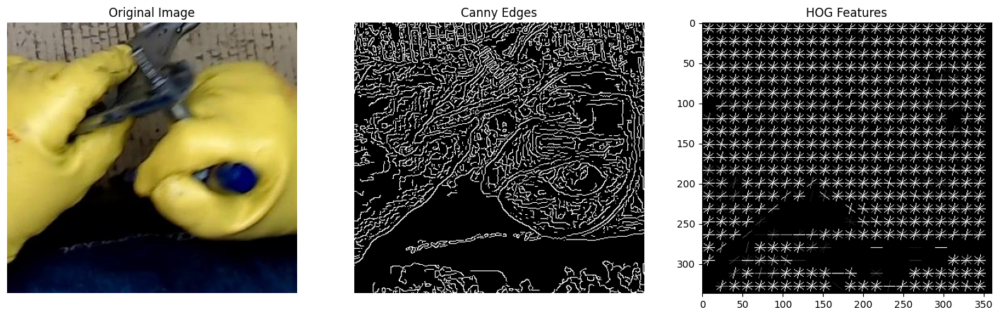

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

# doi: 10.1109/ICOEI51242.2021.9453095
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import exposure

def apply_canny_and_hog(image_path):
    """Apply Canny edge detection and HOG feature extraction, then visualize the results."""
    # Load and preprocess the image
    img = cv2.imread(image_path)
    img_gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert to grayscale
    
    # Apply Canny edge detection
    edges = cv2.Canny(img_gray, threshold1=100, threshold2=200, 
                     apertureSize=5,  
                     L2gradient=True)
    
    # Compute HOG features and image
    hog_features, hog_image = hog(
        edges, 
        pixels_per_cell=(16, 16), 
        cells_per_block=(1, 1), 
        visualize=True
    )
    
    # Rescale HOG image for better visualization
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    # Plot the results
    plt.figure(figsize=(18, 6))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(edges, cmap='gray')
    plt.title('Canny Edges')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(hog_image_rescaled, cmap='gray')
    plt.title('HOG Features')
    plt.show()

image_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/frames_5_xyz_w_cropped/frame_00041.jpg'
apply_canny_and_hog(image_path)

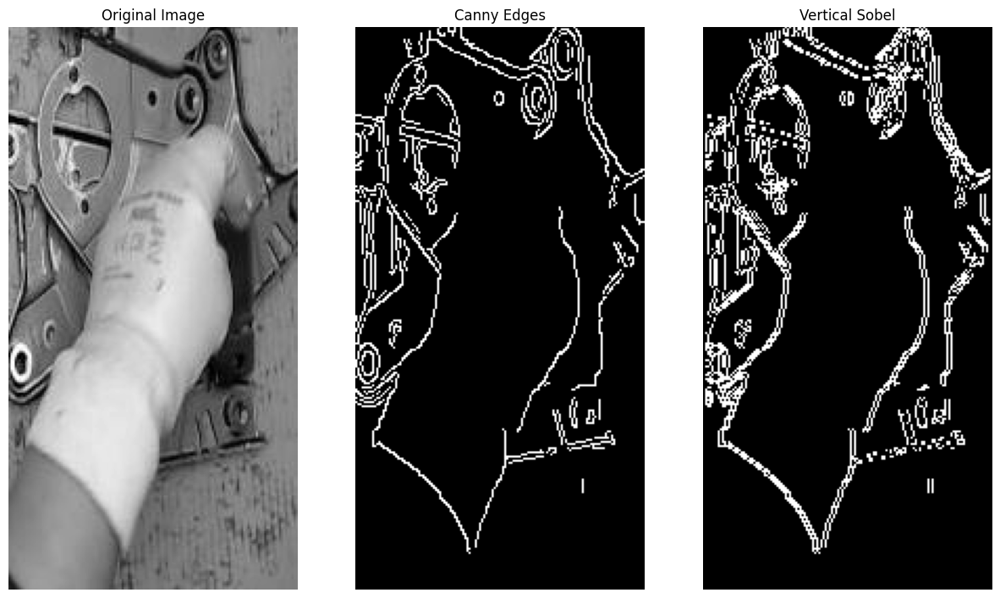

In [166]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_canny_sobel(image):
    """
    Applies Canny edge detection followed by a vertical Sobel filter to the input image.
    
    Parameters:
    - image (numpy array): Input image in grayscale.
    
    Returns:
    - edges (numpy array): Image after applying Canny edge detection.
    - sobel_vertical (numpy array): Image after applying the vertical Sobel filter.
    """
    # Apply Canny edge detection
    edges  = apply_canny(image, aperture_size=3, t_lower=150, t_upper=300) 

    # Apply vertical Sobel filter
    sobel_vertical = cv2.Sobel(edges, cv2.CV_64F, 1, 0, ksize=1)

    # Convert the Sobel result to an 8-bit image
    sobel_vertical = cv2.convertScaleAbs(sobel_vertical)
    
    return edges, sobel_vertical

def show_image_steps(image_path):
    """
    Processes an image by applying Canny and Sobel filters, and displays the original image,
    Canny edges, and Sobel results.
    
    Parameters:
    - image_path (str): Path to the image file.
    """
    # Read the image in grayscale
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Apply Canny and Sobel filters
    edges, sobel_vertical = apply_canny_sobel(image)

    # Display the original and processed images using matplotlib
    plt.figure(figsize=(15, 10))

    plt.subplot(1, 3, 1)
    plt.title("Original Image")
    plt.imshow(image, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.title("Canny Edges")
    plt.imshow(edges, cmap='gray')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.title("Vertical Sobel")
    plt.imshow(sobel_vertical, cmap='gray')
    plt.axis('off')

    plt.show()

# Example usage
image_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/pickup_cropped/epedal_cima_mp4-0004_jpg.rf.ba936cf663e89110ff27b19a3cd70d3a_hand_1.jpg'
show_image_steps(image_path)


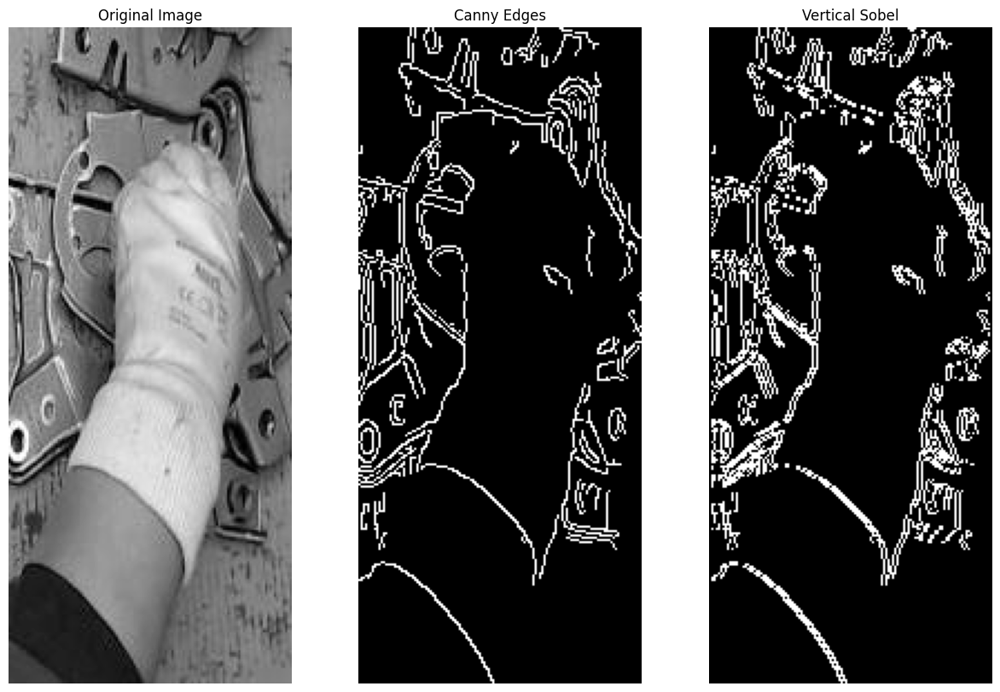

In [172]:
image_path = '/Users/nunofernandes/PycharmProjects/challenge_vc/pickup_cropped/epedal_cima_mp4-0000_jpg.rf.c5e6fb0ca0936323a481fbd25b08c82c_hand_1.jpg'
show_image_steps(image_path)